# Topic Modeling

#### Libraries to manipulate data, vectorize text, extract topics, plot graphs

In [6]:
import pandas as pd
import numpy as np
from collections import Counter

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from wordcloud import WordCloud

from scipy.cluster import hierarchy as sch
from bertopic import BERTopic

import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

import pyLDAvis
import pyLDAvis.sklearn

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning) 

## 1. Loading our data scraped from news websites & cleaning text

In [19]:
data = pd.read_csv("scraping/full.csv", sep=";", encoding="ANSI")
data.head()

,Date,Journal,Article
0,23/02/2022,Le Monde,Présidentielle 2022 : sur fond de crise ukrain...
1,23/02/2022,Le Monde,"Retour au septennat, législatives à mi-mandat,..."
2,23/02/2022,Le Monde,Jean-Pierre Chevènement va apporter son soutie...
3,23/02/2022,Le Monde,Marine Le Pen peine encore à trouver ses parra...
4,23/02/2022,Le Monde,Sibyle Veil : « J’ai choisi de nommer Adèle Va...


In [20]:
# 15 journals
data['Journal'].unique()

array(['Le Monde', 'Le Figaro', 'C News', '20 minutes', 'Les Echos',
       'France Info', 'Nouvel Obs', "L'Express", 'BFM TV', 'Marianne',
       'La Croix', 'Le Point', 'Valeurs Actuelles', 'Libération',
       "L'Humanité", nan], dtype=object)

In [21]:
# formatting datetime & dropping duplicates (ads, some headlines at several locations on websites)
data['Date'] = pd.to_datetime(data['Date'],infer_datetime_format=True)
data.dropna(how='any',inplace=True)
data.drop_duplicates(inplace=True,keep='first',subset=['Journal', 'Article'])

data.describe(include='all',datetime_is_numeric=True)

,Date,Journal,Article
count,56281,56281,56281
unique,NaN,15,55946
top,NaN,France Info,Elon Musk rachète Twitter pour 44 milliards de...
freq,NaN,11483,5
mean,2022-03-24 07:29:28.049608448,NaN,NaN
min,2022-02-23 00:00:00,NaN,NaN
25%,2022-03-09 00:00:00,NaN,NaN
50%,2022-03-24 00:00:00,NaN,NaN
75%,2022-04-09 00:00:00,NaN,NaN
max,2022-04-25 00:00:00,NaN,NaN


In [22]:
# removing punctuation but keeping special french characters, lowering
data['clean_articles'] = data['Article'].str.replace(r"[\W_]+", " ",regex=True)
data['clean_articles'] = data['clean_articles'].fillna('').apply(lambda x: x.lower())
display(data.head())
text_max_length = data.Article.map(lambda x: len(x)).max()
print(f'Max length of sequence : {text_max_length}')

,Date,Journal,Article,clean_articles
0,2022-02-23,Le Monde,Présidentielle 2022 : sur fond de crise ukrain...,présidentielle 2022 sur fond de crise ukrainie...
1,2022-02-23,Le Monde,"Retour au septennat, législatives à mi-mandat,...",retour au septennat législatives à mi mandat p...
2,2022-02-23,Le Monde,Jean-Pierre Chevènement va apporter son soutie...,jean pierre chevènement va apporter son soutie...
3,2022-02-23,Le Monde,Marine Le Pen peine encore à trouver ses parra...,marine le pen peine encore à trouver ses parra...
4,2022-02-23,Le Monde,Sibyle Veil : « J’ai choisi de nommer Adèle Va...,sibyle veil j ai choisi de nommer adèle van re...


Max length of sequence : 203


## 2. Preprocessing & clustering

In [ ]:
import fr_core_news_md
from spacy.lang.fr.stop_words import STOP_WORDS

In [ ]:
# lemmatizing and removing stopwords
nlp = fr_core_news_md.load()
data['token_lemma'] = data['Article'].apply(lambda x: " ".join([token.lemma_ for token in nlp(x) \
                    if (token.lemma_ not in STOP_WORDS) & (token.text not in STOP_WORDS)]))

data['clean_lemma'] = data['token_lemma'].str.replace(r"[\W_]+", " ",regex=True)
data.head()

,Date,Journal,Article,clean_articles,token_lemma,clean_lemma
0,2022-02-23,Le Monde,Présidentielle 2022 : sur fond de crise ukrain...,présidentielle 2022 sur fond de crise ukrainie...,"présidentiel 2022 : fond crise ukrainien , H...",présidentiel 2022 fond crise ukrainien Hidalgo...
1,2022-02-23,Le Monde,"Retour au septennat, législatives à mi-mandat,...",retour au septennat législatives à mi mandat p...,"septennat , législative mi-mandat , prérogativ...",septennat législative mi mandat prérogative El...
2,2022-02-23,Le Monde,Jean-Pierre Chevènement va apporter son soutie...,jean pierre chevènement va apporter son soutie...,Jean-Pierre Chevènement apporter soutien Emman...,Jean Pierre Chevènement apporter soutien Emman...
3,2022-02-23,Le Monde,Marine Le Pen peine encore à trouver ses parra...,marine le pen peine encore à trouver ses parra...,marine Pen peine trouver parrainage,marine Pen peine trouver parrainage
4,2022-02-23,Le Monde,Sibyle Veil : « J’ai choisi de nommer Adèle Va...,sibyle veil j ai choisi de nommer adèle van re...,Sibyle Veil : « choisir nommer Adèle Van R...,Sibyle Veil choisir nommer Adèle Van Reeth rem...


In [2]:
# data.to_csv('scraping/full_clean_lemmatized.csv', index=False)
data = pd.read_csv('scraping/full_clean_lemmatized.csv')

#### Latent Dirichlet Allocation

In [ ]:
# vectorizing for LDA
vectorizer = CountVectorizer(analyzer = 'word', ngram_range = (1, 2))
vectors = []

for index, row in data.iterrows():
    vectors.append(row['clean_lemma'])

vectorised = vectorizer.fit_transform(vectors)
print(vectorised[0])

  (0, 167747)	1
  (0, 2012)	1
  (0, 84676)	1
  (0, 53061)	1
  (0, 215376)	1
  (0, 98185)	1
  (0, 108921)	1
  (0, 222388)	1
  (0, 55549)	1
  (0, 137839)	1
  (0, 167756)	1
  (0, 2437)	1
  (0, 84687)	1
  (0, 53169)	1
  (0, 215629)	1
  (0, 98236)	1
  (0, 109043)	1
  (0, 222412)	1
  (0, 55575)	1


In [ ]:
# initializing LDA Model with 14 topics
lda_model = LatentDirichletAllocation(n_components = 14, random_state = 1, evaluate_every = -1,n_jobs = -1)
lda_output = lda_model.fit_transform(vectorised)

topic_names = ["Topic" + str(i) for i in range(1, lda_model.n_components + 1)]
df_topics = pd.DataFrame(np.round(lda_output, 2), columns = topic_names)

# get dominant topic for each article
dominant_topic = (np.argmax(df_topics.values, axis=1)+1)
df_topics['Dominant_topic'] = dominant_topic

# join to original dataframe
data = pd.merge(data, df_topics['Dominant_topic'], left_index = True, right_index = True, how = 'outer')
display(data.head())

,Date,Journal,Article,clean_articles,token_lemma,clean_lemma,Dominant_topic
0,2022-02-23,Le Monde,Présidentielle 2022 : sur fond de crise ukrain...,présidentielle 2022 sur fond de crise ukrainie...,"présidentiel 2022 : fond crise ukrainien , H...",présidentiel 2022 fond crise ukrainien Hidalgo...,6.0
1,2022-02-23,Le Monde,"Retour au septennat, législatives à mi-mandat,...",retour au septennat législatives à mi mandat p...,"septennat , législative mi-mandat , prérogativ...",septennat législative mi mandat prérogative El...,12.0
2,2022-02-23,Le Monde,Jean-Pierre Chevènement va apporter son soutie...,jean pierre chevènement va apporter son soutie...,Jean-Pierre Chevènement apporter soutien Emman...,Jean Pierre Chevènement apporter soutien Emman...,8.0
3,2022-02-23,Le Monde,Marine Le Pen peine encore à trouver ses parra...,marine le pen peine encore à trouver ses parra...,marine Pen peine trouver parrainage,marine Pen peine trouver parrainage,7.0
4,2022-02-23,Le Monde,Sibyle Veil : « J’ai choisi de nommer Adèle Va...,sibyle veil j ai choisi de nommer adèle van re...,Sibyle Veil : « choisir nommer Adèle Van R...,Sibyle Veil choisir nommer Adèle Van Reeth rem...,10.0


In [3]:
data = data.drop_duplicates(subset=['clean_lemma'])
# regrouping articles from different journals in one big list of strings
docs = data['clean_lemma'].dropna().tolist()
date_list = data['Date'].dropna().tolist()
journals = data['Journal'].dropna().tolist()

len(journals) == len(date_list) == len(docs)

doc = ' '.join(docs) #wordcloud will need all of this in one big string, not strings inside of a list

In [ ]:
docs[:5]

['présidentiel 2022 fond crise ukrainien Hidalgo Jadot viser danger Mélenchon',
 'septennat législative mi mandat prérogative Elysée limiter CESE auditionner candidat élection présidentiel',
 'Jean Pierre Chevènement apporter soutien Emmanuel Macron',
 'marine Pen peine trouver parrainage',
 'Sibyle Veil choisir nommer Adèle Van Reeth remplacer Laurence Bloch tête France Inter ']

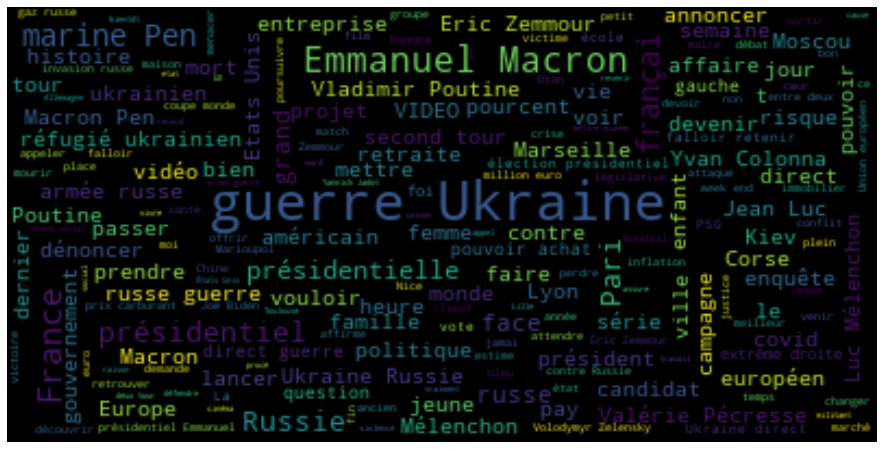

In [ ]:
wordcloud = WordCloud(max_font_size=25).generate(doc)
plt.figure(figsize=(16,8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [ ]:
topic_count = data['Dominant_topic'].value_counts()
topic_percentages = topic_count/sum(topic_count)*100
topic_percentages
# topic distribution

9.0     14.916224
2.0     12.432260
11.0     7.883655
7.0      7.290205
12.0     6.853112
6.0      6.096196
3.0      6.035785
8.0      6.009133
5.0      5.930954
4.0      5.906078
1.0      5.861658
10.0     5.126064
13.0     4.914625
14.0     4.744052
Name: Dominant_topic, dtype: float64

In [ ]:
fig = pyLDAvis.sklearn.prepare(lda_model, vectorised, vectorizer)
pyLDAvis.save_html(fig, 'images/lda_result.html')

In [ ]:
from IPython.core.display import HTML
display(HTML('images/lda_result.html'))
#html file available on github in images folder

Topic 1 is quite clearly the French Presidential Elections and set well apart from the rest, while 2, 3 and to some extent 6 are about the war in Ukraine & international news.<br>
LDA struggles to make sense of the remaining topics, with some of them somewhat making sense and others left completely undefined.

There may be something to the vocabulary clustering of all these, but it won't be very useful as it is.<br>
Clearly, LDA may have isolated word groups but not understandable topics.

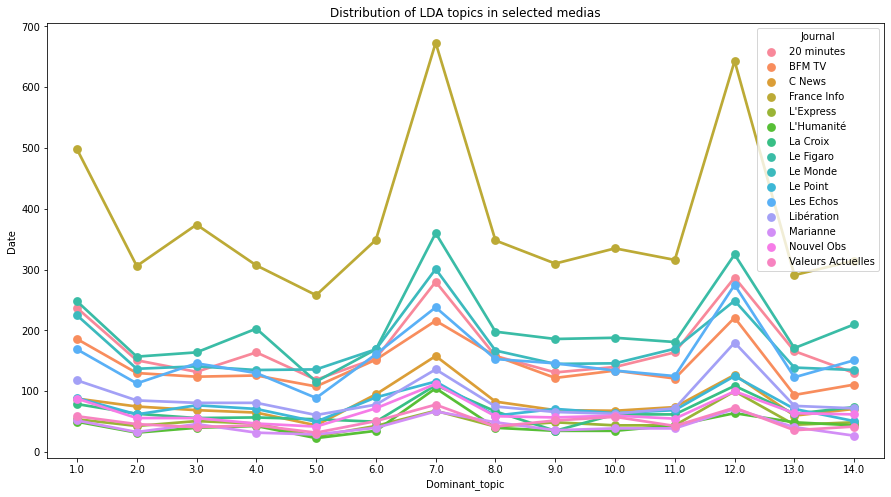

In [ ]:
distrib_count = data.groupby(['Journal','Dominant_topic'])['Date'].count().reset_index()

plt.figure(figsize=(15,8))
sns.pointplot(x='Dominant_topic',y='Date',hue='Journal', data = distrib_count).set_title('Distribution of LDA topics in selected medias')
plt.show()

Plotting LDA topics per news outlet presents a very similar distribution (with expected differences in quantity) for all news outlets.<br>
Does everyone speak about the same things, only sometimes differently? We'd have to explore more.<br><br>
We might be able to fix our topic distribution by tweaking the LDA parameters, number of topics, changing the n-gram rules... but let's see if we can come up with something better using BERT.<br>
The difference in approach, more than the inherent capabilities of the algorithm, should be more suited to manage the imbalance in our data (i.e. the presence of two topics, the war in Ukraine and the elections, vastly more than others).

#### Topics with BERT

For this I am going to use BERTopic, which is a neural topic modeling with a class-based TF-IDF procedure

In [4]:
# avoid umap pynndescent conflicts with numpy >= 1.21
import numba
@numba.njit(fastmath=True)
def correct_alternative_cosine(ds):
    result = np.empty_like(ds)
    for i in range(ds.shape[0]):
        result[i] = 1.0 - np.power(2.0, ds[i])
    return result

import pynndescent
pynn_dist_fns_fda = pynndescent.distances.fast_distance_alternatives
pynn_dist_fns_fda["cosine"]["correction"] = correct_alternative_cosine
pynn_dist_fns_fda["dot"]["correction"] = correct_alternative_cosine

In [7]:
topic_model = BERTopic(verbose=True,language='french',embedding_model="all-MiniLM-L6-v2") #leaving default c-TF-IDF
topics, probs = topic_model.fit_transform(docs)
# docs contains all the articles ; cf preprocessing above wordcloud

Batches:   0%|          | 0/1715 [00:00<?, ?it/s]

2022-12-20 10:55:34,984 - BERTopic - Transformed documents to Embeddings
2022-12-20 10:56:38,116 - BERTopic - Reduced dimensionality
2022-12-20 10:56:43,313 - BERTopic - Clustered reduced embeddings


In [13]:
# Save model
topic_model.save("topic_model")
# topic_model = BERTopic.load("topic_model")	

In [8]:
topic_model.get_topic_info() # -1 refers to all outliers : noise topic.

,Topic,Count,Name
0,-1,21769,-1_france_français_jeune_pen
1,0,702,0_ukraine_conflit_guerre_conséquence
2,1,576,1_emmanuel_macron_réélection_réélire
3,2,487,2_gaz_pétrole_embargo_rouble
4,3,474,3_offensive_armée_russe_invasion
...,...,...,...
590,589,10,589_triple_homicide_quadruple_franconville
591,590,10,590_avignon_py_festival_oif
592,591,10,591_co2_émission_méthane_secteur
593,592,10,592_entrepreneuriat_entrepreneur_individuel_fa...


In [304]:
topic_model.get_representative_docs(591)

['émission co2 secteur énergétique remonter fortement 2021 AIE',
 'Réchauffement climatique hausse record niveau méthane atmosphère 2021',
 'climat émission méthane issu secteur énergie sous estimer hausse']

In [15]:
# Hierarchical topics
linkage_function = lambda x: sch.linkage(x, 'complete', optimal_ordering=True) # Farthest Neighbor Algorithm for somewhat conservative clustering
hierarchical_topics = topic_model.hierarchical_topics(docs, linkage_function=linkage_function)

100%|██████████| 593/593 [00:05<00:00, 106.13it/s]


In [14]:
max(topics)

593

An interesting clustering to explore, but there are too many topics to go forward with meaningful visualizations.<br>
We'll have to reduce them and transform them into more easily explainable themes, while maintaining the same logic.

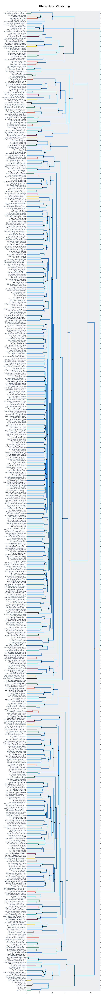

In [16]:
fig = topic_model.visualize_hierarchy(hierarchical_topics=hierarchical_topics)
fig.show('png')

60it [00:26,  2.22it/s]


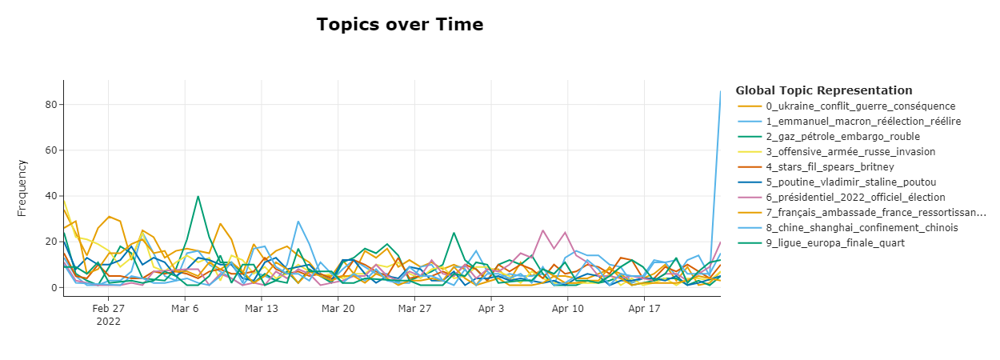

In [17]:
topics_over_time = topic_model.topics_over_time(docs, date_list, nr_bins=60)

fig = topic_model.visualize_topics_over_time(topics_over_time, top_n_topics=10)
fig.show('png')

The topic distribution is interesting, with a recognizable surge in election-related themes around April 10 and 24, the French presidential election.<br>
Some smaller peaks also coincide with events mentioned in news (election speeches, war news...).<br>
This still displays much too redundant themes however. There is also the significant issue if ignored "outliers", 2/5 of the data.

## 3. Classification

Topics from INA in french tv news:<br>
Catastrophes, Culture-loisirs, Economie, Education, Environnement, Faits divers, Histoire-hommages, International, Justice, Politique France, Santé, Sciences et techniques, Société, Sport

Attempting zero-shot text classification with these labels :

In [170]:
from transformers import pipeline
classifier = pipeline("zero-shot-classification", model="facebook/bart-large-mnli")

# example topic transformation
sequence_to_classify =  " ".join([word for word, _ in topic_model.get_topic(1)])
candidate_labels = ['Catastrophes', 'Culture-loisirs', 'Economie', 'Education', 'Environnement', 'Faits divers', 'Histoire-hommages', 
                        'International', 'Justice', 'Politique France', 'Santé', 'Sciences et techniques', 'Société', 'Sport']
result = classifier(sequence_to_classify, candidate_labels)
print(f"The following sequence:\n'{result['sequence']}'\n was classified as {result['labels'][0]}, with a confidence of {round(result['scores'][0]-result['scores'][1],3)} above the next possible label")

The following sequence:
'offensive russe armée invasion russie avancée ukraine troupe guerre militaire'
 was classified as International, with a confidence of 0.187 above the next possible label


Decent so far

In [171]:
# applying new labels on all topics
new_labels = []
for i in range(len(topic_model.topic_labels_)):
    sequence_to_classify =  " ".join([word for word, _ in topic_model.get_topics()[i-1]])
    candidate_labels = ['Catastrophes', 'Culture-loisirs', 'Economie', 'Education', 'Environnement', 'Faits divers', 'Histoire-hommages', 
                        'International', 'Justice', 'Politique France', 'Santé', 'Sciences et techniques', 'Société', 'Sport']
    dict_label = classifier(sequence_to_classify, candidate_labels)
    dict_index = np.argmax(dict_label['scores'])
    new_label = dict_label['labels'][dict_index]
    new_labels.append(new_label)

Let's look into words that contribute to this classification...

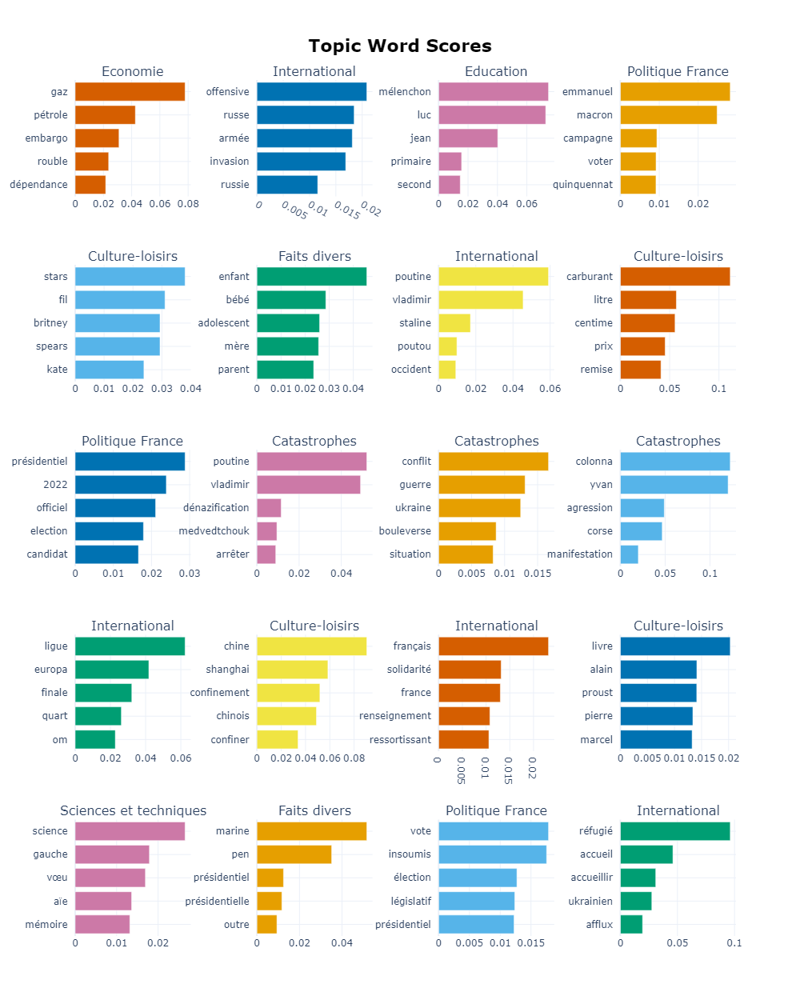

In [173]:
topic_model.set_topic_labels(new_labels)
fig = topic_model.visualize_barchart(custom_labels=True,top_n_topics=20)
fig.show('png')

Well, it's not too bad, but clearly not reliable. The visualized sample is 50% correct.<br>
His political party might enjoy seeing "mélenchon" as a key word for Education, but for analytical purposes that won't do. "poutine" (Russian president Vladimir Putin, not the canadian dish) may be a catastrophe, but this isn't a good topic match either.<br>
Some words such as "carburant" (fuel), "chine" (China) end up in culture and others such as "europa" "ligue" (Europa soccer league) are intuitively understandable mislabels, but we'll have to fix that too.

We'll have to merge topics manually and then give them custom names

In [18]:
topic_model.visualize_topics()
# helpful visualization to merge topics

### CURRENT STEP -- WORK IN PROGRESS

In [308]:
topics_to_merge = [
[386,557,162,50,205,532,197,509,530,98,23,107,578,101,12,6,87,104,40,48,1,25,188,78,167,16,24,36,28,361,557,168,541,524,556,296,396,
268,418,195,243,121,550,346,563,558,263,495,94,330,318,566,115,216,360,21,269,242,259,518,298,230,322,529,478,34,413,210,181,254,570,
381,273,283,548,572,53,202,255,533,527,160,27,219,222,411,41], #Politique France

[73,70,76,103,99,7,0,3,383,324,164,96,152,61,531,122,309,85,20,501,10,5,88,488,108,218,308,358,429,215,588,123,82,293,512,399,254,105,
244,584,303,241,231,350,402,482,266,536,290,344,502,490,317,567,537,39,287,232,579,340,265,261,208,410,312,375,480,445,249,405,388,540,
226,140,573,552,444,516,474,203,453,499,51,8,33,182,237,198,31,526,159,125,486,47,190,577,64,401,476,417,38,145,299,359,134,336,391,448,
175,282,217,337,183,131,559,91,407], #International

[520,392,233,459,81,286,35,9,496,327,449,387,363,258,397,494,306,201,80,185,209,58,428,549,66,465,234,172,176,111,135,442,420,154,538,133,
295,467,142,385], #Sports

[270,250,378,404,62,505,341,199], #Catastrophes

[404,409,69,157,92,498,180,544,292,49,15,348,508,510,507,436,55,45,521,369,441,497,229,97,156,470,547,513,57,491,13,328,464,457,464,93,
247,246,196,347,126,422,43,561,431,280,276,408,424,148,487,582,394,279,471,477,511,461,574,539,63,158,278,284,26,90,95,252,65,506,194,
264,207], #Société

[432,84,46,177,139,289,248,534,325,352,462,170,362,592,403,543,576,310,587,517,565,117,52,406,434,150,493,141,412,389,473,379,546,419,
492,560,438,332,390,204,173,297,586,500,291,221,169,319,211,30,136,551,83,364,366,151,113,161,272,192,267,22,421,377,274,11,338,2,102,
426,514,74,313,165,275,29,184,452,468,380,212,114,236,331], #Economie

[110,116,483,400,155,451,143,240,353,294,300,419,526,128,321,570,257], #Sciences & techniques

[335,223,60,355,314,553,423,213,384,187,469,393,479,316,288,262,370,256,535,220,124,351,18,339,285,302,260,17,435,166,100,433,440,415,323,463], #Santé

[456,373,179,589,235,281,37,564,425,376,439,342,450,460,120,320,305,193,119,68], #Faits divers

[79,127,112,522,443,241,555,137,427,374,356,345,365,301,504,206,54,129,485,481,14,334], #Justice

[371,56,144,542,343,224,89,44,562,72,174,138,75,528,458,454,372,590,118,146,4,525,304,484,367,523,568,581,277,239,475,311,227,225,59,32,19,
414], #Culture & loisirs

[214,554,147,382,515,395,571,585,580], #Histoire & hommages

[253,455,416,37,238,481,132,153,591,251,106,171,519,583,398,472,42,569,178,149,326,593,437,228,86], #Environnement

[367,307,466,163,349,271,67], #Education

[503,315,109,186,545,189,333,446,191,354,77,130,329,447] #NA
]
topic_model.merge_topics(docs, topics_to_merge)

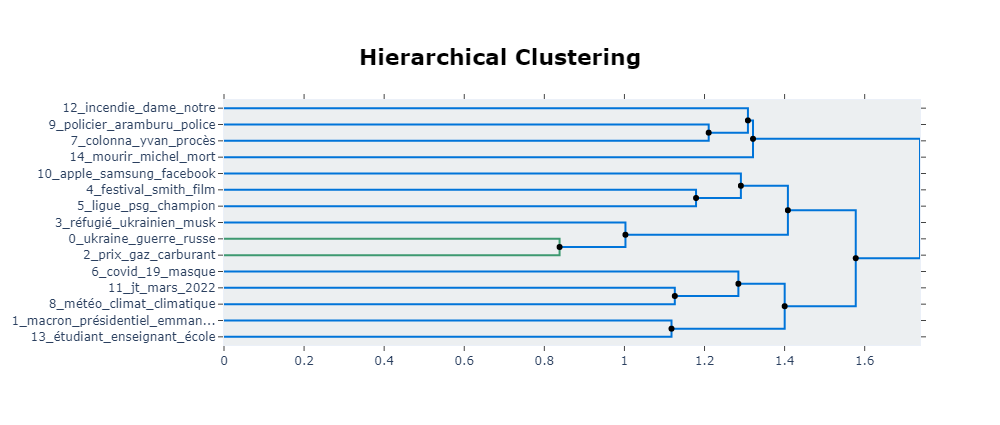

In [346]:
fig = topic_model.visualize_hierarchy(hierarchical_topics=hierarchical_topics)
fig.show('png')

In [404]:
new_labels = [np.nan,'International', 'Politique France', 'Economie', 'Société', 'Culture & loisirs', 'Sports', 'Santé',
 'Justice', 'Environnement', 'Faits divers', 'Science & technique', 'NA', 'Catastrophes', 'Education', 'Histoire & hommages']
topic_model.set_topic_labels(new_labels)

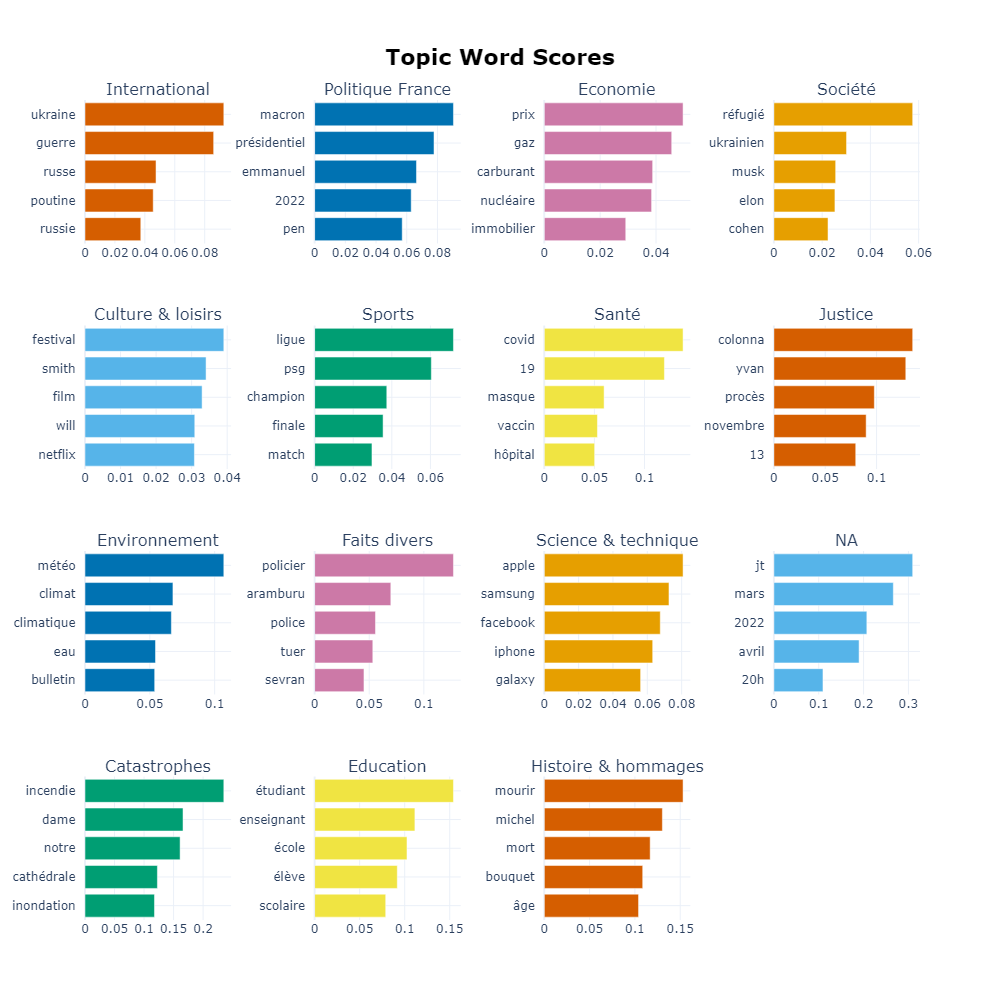

In [355]:
fig = topic_model.visualize_barchart(custom_labels=True,top_n_topics=20)
fig.show('png')

In [358]:
topics_per_class = topic_model.topics_per_class(docs, classes=journals)

fig = topic_model.visualize_topics_per_class(topics_per_class, top_n_topics=15,custom_labels=True)
fig.show()

15it [00:00, 18.75it/s]


In [364]:
len(topic_model.topics_)

54875

60it [00:06,  9.49it/s]


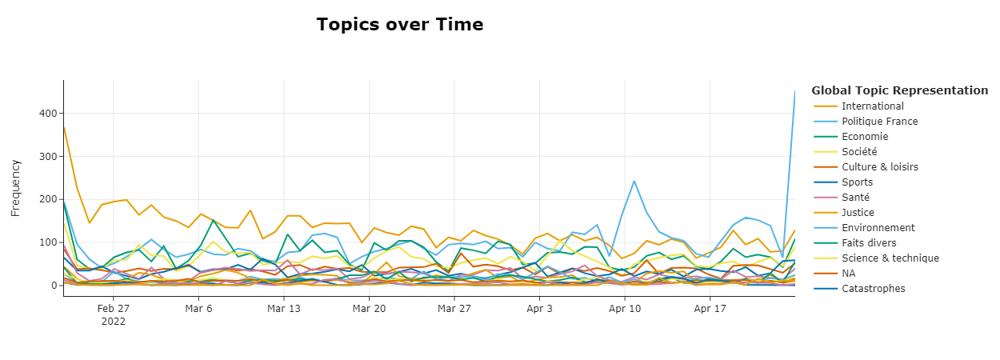

In [399]:
topics_over_time = topic_model.topics_over_time(docs, date_list, nr_bins=60)

fig = topic_model.visualize_topics_over_time(topics_over_time, top_n_topics=15,custom_labels=True)
fig.show('png')

In [383]:
labels_list = []
for e in topic_model.topics_:
    labels_list.append(new_labels[e+1])

In [397]:
data['topic'] = labels_list
data.to_csv('scraping/full_clean_lemma_topic.csv', index=False)

That's a lot better but still a lot of outliers we'll need to handle

In [405]:
topic_model.get_topic_info() 

,Topic,Count,Name,CustomName
0,-1,21769,-1_ukraine_guerre_france_macron,NaN
1,0,7725,0_ukraine_guerre_russe_poutine,International
2,1,6204,1_macron_présidentiel_emmanuel_2022,Politique France
3,2,4446,2_prix_gaz_carburant_nucléaire,Economie
4,3,3690,3_réfugié_ukrainien_musk_elon,Société
5,4,2356,4_festival_smith_film_will,Culture & loisirs
6,5,2050,5_ligue_psg_champion_finale,Sports
7,6,1639,6_covid_19_masque_vaccin,Santé
8,7,1122,7_colonna_yvan_procès_novembre,Justice
9,8,978,8_météo_climat_climatique_eau,Environnement


In [403]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 54875 entries, 0 to 54874
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Date            54875 non-null  object
 1   Journal         54875 non-null  object
 2   Article         54875 non-null  object
 3   clean_articles  54875 non-null  object
 4   token_lemma     54875 non-null  object
 5   clean_lemma     54875 non-null  object
 6   topic           33106 non-null  object
dtypes: object(7)
memory usage: 3.3+ MB


In next notebook, dealing with so-called "outliers" (subjects too close to differentiate in the 1st batch)